# load libraries

In [281]:
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
from random import seed
from scipy.special import expit as sigmoid
from sklearn.metrics import roc_auc_score
import seaborn as sns

# load data

In [282]:
botulism = pd.read_csv("botulism_climate_us.csv")

# clean and scale data

In [283]:
botulism['outbreak'] = (botulism['num_cases'] > 2).astype(int)

In [284]:
botulism['state_idx'] = pd.Categorical(botulism['state']).codes
num_states = botulism['state_idx'].nunique()

In [285]:
temp_mean = botulism['avg_temp'].mean()
temp_std = botulism['avg_temp'].std()
botulism['temp_scaled'] = (botulism['avg_temp'] - temp_mean) / temp_std

precip_mean = botulism['avg_precipitation'].mean()
precip_std = botulism['avg_precipitation'].std()
botulism['avg_precipitation'] = (botulism['avg_precipitation'] - precip_mean) / precip_std

In [286]:
y = botulism['outbreak'].values
temp = botulism['temp_scaled'].values
precip = botulism['avg_precipitation'].values
state_idx = botulism['state_idx'].values

In [287]:
pos_idx = np.where(botulism["num_cases"] > 2)[0]
counts_pos = botulism.loc[pos_idx, "num_cases"].values
temp_pos = temp[pos_idx]
precip_pos = precip[pos_idx]
state_idx_pos = state_idx[pos_idx]

# prior predictive checks

In [ ]:
num_vals = 1000

### alpha outbreak prob
should be normal because it will get transformed into probability scale with logit

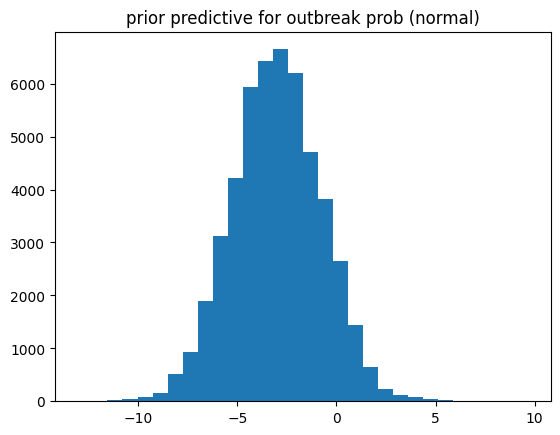

In [ ]:
with pm.Model() as prior_pred:

    mu_alpha = pm.Normal("mu_alpha", mu=pm.math.logit(0.05), sigma=2)
    sigma_alpha = pm.HalfNormal("sigma_alpha", sigma=1)

    alpha = pm.Normal("alpha", mu=mu_alpha, sigma=sigma_alpha, shape=num_states)

    prior = pm.sample_prior_predictive(samples=num_vals)


samples = prior.prior['alpha'].values.flatten()

plt.hist(samples, bins=30)
plt.title("prior predictive for outbreak prob (normal)")
plt.show()

/usr/local/lib/python3.12/dist-packages/arviz/plots/plot_utils.py:270: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (50) in plot_posterior, generating only 40 plots
  warnings.warn(


array([[<Axes: title={'center': 'alpha\n0'}>,
        <Axes: title={'center': 'alpha\n1'}>,
        <Axes: title={'center': 'alpha\n2'}>,
        <Axes: title={'center': 'alpha\n3'}>],
       [<Axes: title={'center': 'alpha\n4'}>,
        <Axes: title={'center': 'alpha\n5'}>,
        <Axes: title={'center': 'alpha\n6'}>,
        <Axes: title={'center': 'alpha\n7'}>],
       [<Axes: title={'center': 'alpha\n8'}>,
        <Axes: title={'center': 'alpha\n9'}>,
        <Axes: title={'center': 'alpha\n10'}>,
        <Axes: title={'center': 'alpha\n11'}>],
       [<Axes: title={'center': 'alpha\n12'}>,
        <Axes: title={'center': 'alpha\n13'}>,
        <Axes: title={'center': 'alpha\n14'}>,
        <Axes: title={'center': 'alpha\n15'}>],
       [<Axes: title={'center': 'alpha\n16'}>,
        <Axes: title={'center': 'alpha\n17'}>,
        <Axes: title={'center': 'alpha\n18'}>,
        <Axes: title={'center': 'alpha\n19'}>],
       [<Axes: title={'center': 'alpha\n20'}>,
        <Axes: tit

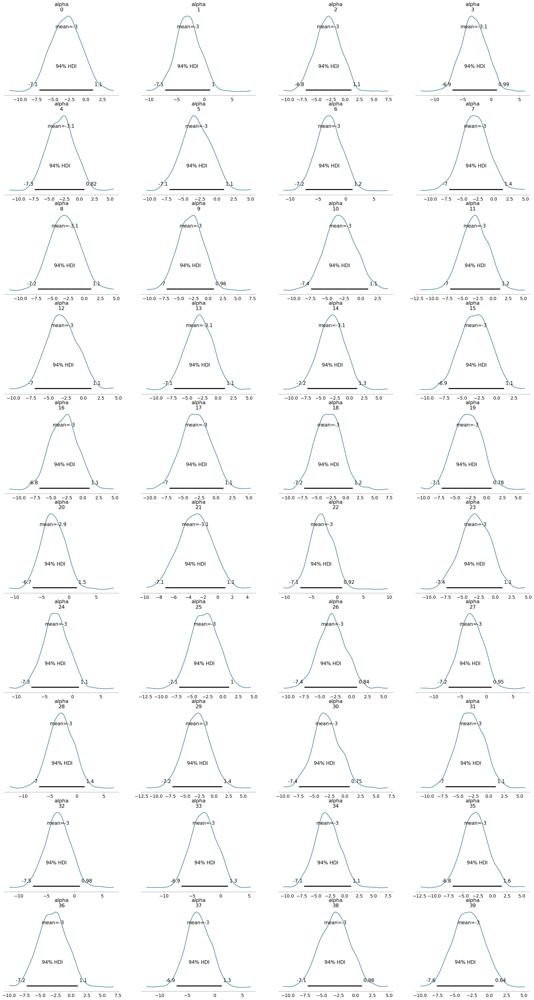

In [ ]:
az.plot_posterior(prior, var_names=['alpha'], group='prior')

### original beta temp
weakly informative, mu is centered at zero because expecting temp has no effect

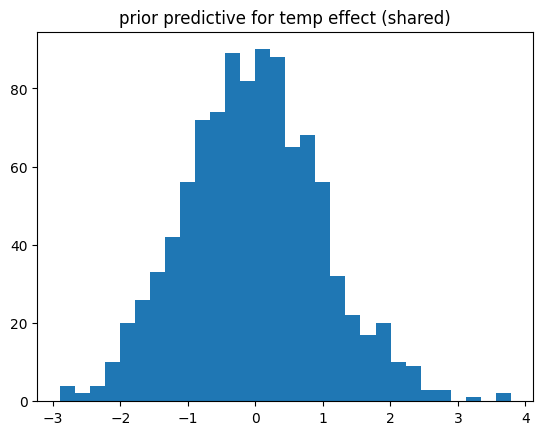

In [ ]:
with pm.Model():

    beta_temp = pm.Normal("beta_temp", mu=0, sigma=1)

    prior = pm.sample_prior_predictive(samples=num_vals)


samples = prior.prior['beta_temp'].values.flatten()

plt.hist(samples, bins=30)
plt.title("prior predictive for temp effect (shared)")
plt.show()

array([[<Axes: title={'center': 'beta_temp\n0'}>,
        <Axes: title={'center': 'beta_temp\n1'}>,
        <Axes: title={'center': 'beta_temp\n2'}>,
        <Axes: title={'center': 'beta_temp\n3'}>],
       [<Axes: title={'center': 'beta_temp\n4'}>,
        <Axes: title={'center': 'beta_temp\n5'}>,
        <Axes: title={'center': 'beta_temp\n6'}>,
        <Axes: title={'center': 'beta_temp\n7'}>],
       [<Axes: title={'center': 'beta_temp\n8'}>,
        <Axes: title={'center': 'beta_temp\n9'}>,
        <Axes: title={'center': 'beta_temp\n10'}>,
        <Axes: title={'center': 'beta_temp\n11'}>],
       [<Axes: title={'center': 'beta_temp\n12'}>,
        <Axes: title={'center': 'beta_temp\n13'}>,
        <Axes: title={'center': 'beta_temp\n14'}>,
        <Axes: title={'center': 'beta_temp\n15'}>],
       [<Axes: title={'center': 'beta_temp\n16'}>,
        <Axes: title={'center': 'beta_temp\n17'}>,
        <Axes: title={'center': 'beta_temp\n18'}>,
        <Axes: title={'center': 'beta

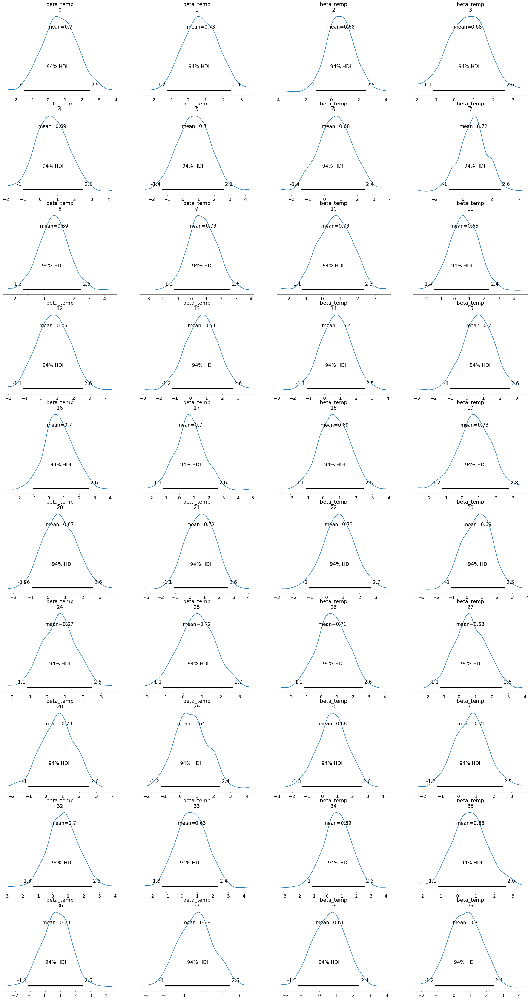

In [ ]:
az.plot_posterior(prior, var_names=['beta_temp'], group='prior')

### adjusted beta temp
* set mu to be ln(expected effect) using domain knowledge about them birds dying

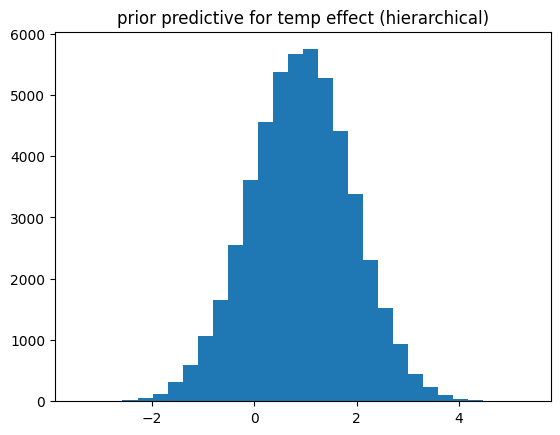

In [ ]:
with pm.Model():

    beta_temp = pm.Normal("beta_temp", mu=np.log(2.5), sigma=1, shape=num_states)

    prior = pm.sample_prior_predictive(samples=num_vals)


samples = prior.prior['beta_temp'].values.flatten()

plt.hist(samples, bins=30)
plt.title("prior predictive for temp effect (hierarchical)")
plt.show()

/usr/local/lib/python3.12/dist-packages/arviz/plots/plot_utils.py:270: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (50) in plot_posterior, generating only 40 plots
  warnings.warn(


array([[<Axes: title={'center': 'beta_temp\n0'}>,
        <Axes: title={'center': 'beta_temp\n1'}>,
        <Axes: title={'center': 'beta_temp\n2'}>,
        <Axes: title={'center': 'beta_temp\n3'}>],
       [<Axes: title={'center': 'beta_temp\n4'}>,
        <Axes: title={'center': 'beta_temp\n5'}>,
        <Axes: title={'center': 'beta_temp\n6'}>,
        <Axes: title={'center': 'beta_temp\n7'}>],
       [<Axes: title={'center': 'beta_temp\n8'}>,
        <Axes: title={'center': 'beta_temp\n9'}>,
        <Axes: title={'center': 'beta_temp\n10'}>,
        <Axes: title={'center': 'beta_temp\n11'}>],
       [<Axes: title={'center': 'beta_temp\n12'}>,
        <Axes: title={'center': 'beta_temp\n13'}>,
        <Axes: title={'center': 'beta_temp\n14'}>,
        <Axes: title={'center': 'beta_temp\n15'}>],
       [<Axes: title={'center': 'beta_temp\n16'}>,
        <Axes: title={'center': 'beta_temp\n17'}>,
        <Axes: title={'center': 'beta_temp\n18'}>,
        <Axes: title={'center': 'beta

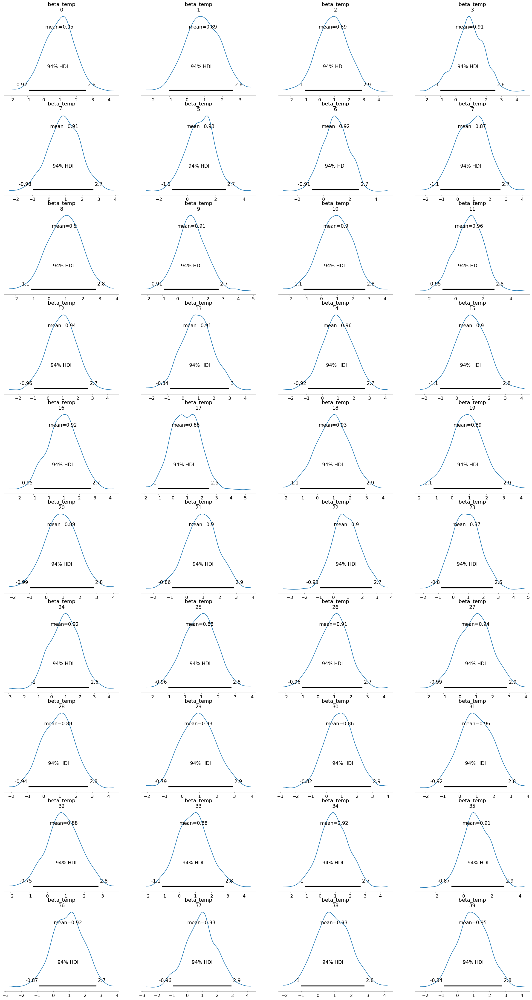

In [ ]:
az.plot_posterior(prior, var_names=['beta_temp'], group='prior')

### original beta precip

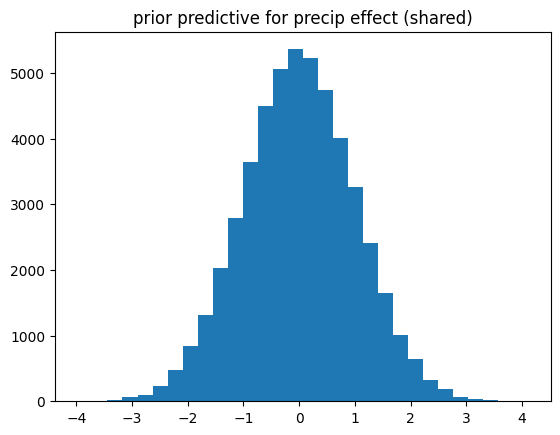

In [ ]:
with pm.Model():

    beta_precip = pm.Normal("beta_precip", mu=0, sigma=1, shape=num_states)

    prior = pm.sample_prior_predictive(samples=num_vals)


samples = prior.prior['beta_precip'].values.flatten()

plt.hist(samples, bins=30)
plt.title("prior predictive for precip effect (shared)")
plt.show()

/usr/local/lib/python3.12/dist-packages/arviz/plots/plot_utils.py:270: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (50) in plot_posterior, generating only 40 plots
  warnings.warn(


array([[<Axes: title={'center': 'beta_precip\n0'}>,
        <Axes: title={'center': 'beta_precip\n1'}>,
        <Axes: title={'center': 'beta_precip\n2'}>,
        <Axes: title={'center': 'beta_precip\n3'}>],
       [<Axes: title={'center': 'beta_precip\n4'}>,
        <Axes: title={'center': 'beta_precip\n5'}>,
        <Axes: title={'center': 'beta_precip\n6'}>,
        <Axes: title={'center': 'beta_precip\n7'}>],
       [<Axes: title={'center': 'beta_precip\n8'}>,
        <Axes: title={'center': 'beta_precip\n9'}>,
        <Axes: title={'center': 'beta_precip\n10'}>,
        <Axes: title={'center': 'beta_precip\n11'}>],
       [<Axes: title={'center': 'beta_precip\n12'}>,
        <Axes: title={'center': 'beta_precip\n13'}>,
        <Axes: title={'center': 'beta_precip\n14'}>,
        <Axes: title={'center': 'beta_precip\n15'}>],
       [<Axes: title={'center': 'beta_precip\n16'}>,
        <Axes: title={'center': 'beta_precip\n17'}>,
        <Axes: title={'center': 'beta_precip\n18'}>,

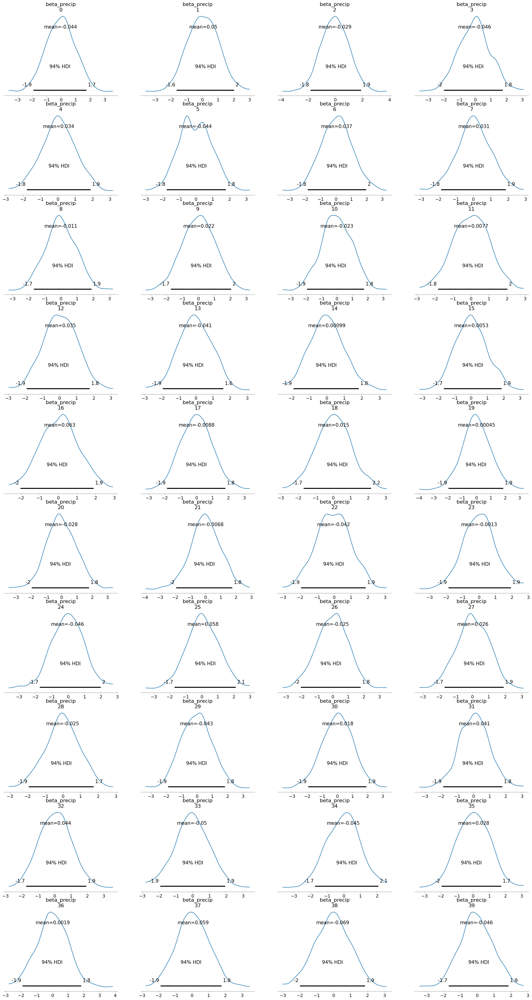

In [ ]:
az.plot_posterior(prior, var_names=['beta_precip'], group='prior')

### adjusted beta precip

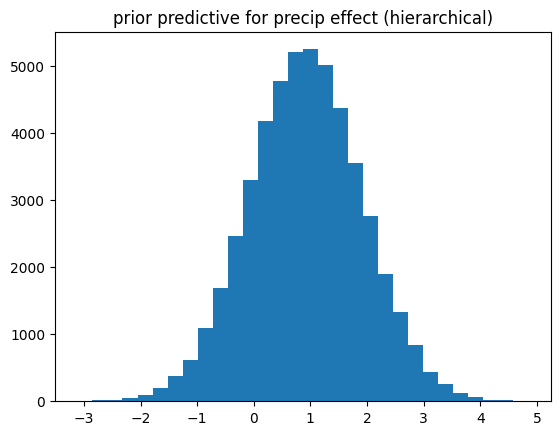

In [ ]:
with pm.Model():

    beta_precip = pm.Normal("beta_precip", mu=np.log(2.5), sigma=1, shape=num_states)

    prior = pm.sample_prior_predictive(samples=num_vals)


samples = prior.prior['beta_precip'].values.flatten()

plt.hist(samples, bins=30)
plt.title("prior predictive for precip effect (hierarchical)")
plt.show()

/usr/local/lib/python3.12/dist-packages/arviz/plots/plot_utils.py:270: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (50) in plot_posterior, generating only 40 plots
  warnings.warn(


array([[<Axes: title={'center': 'beta_precip\n0'}>,
        <Axes: title={'center': 'beta_precip\n1'}>,
        <Axes: title={'center': 'beta_precip\n2'}>,
        <Axes: title={'center': 'beta_precip\n3'}>],
       [<Axes: title={'center': 'beta_precip\n4'}>,
        <Axes: title={'center': 'beta_precip\n5'}>,
        <Axes: title={'center': 'beta_precip\n6'}>,
        <Axes: title={'center': 'beta_precip\n7'}>],
       [<Axes: title={'center': 'beta_precip\n8'}>,
        <Axes: title={'center': 'beta_precip\n9'}>,
        <Axes: title={'center': 'beta_precip\n10'}>,
        <Axes: title={'center': 'beta_precip\n11'}>],
       [<Axes: title={'center': 'beta_precip\n12'}>,
        <Axes: title={'center': 'beta_precip\n13'}>,
        <Axes: title={'center': 'beta_precip\n14'}>,
        <Axes: title={'center': 'beta_precip\n15'}>],
       [<Axes: title={'center': 'beta_precip\n16'}>,
        <Axes: title={'center': 'beta_precip\n17'}>,
        <Axes: title={'center': 'beta_precip\n18'}>,

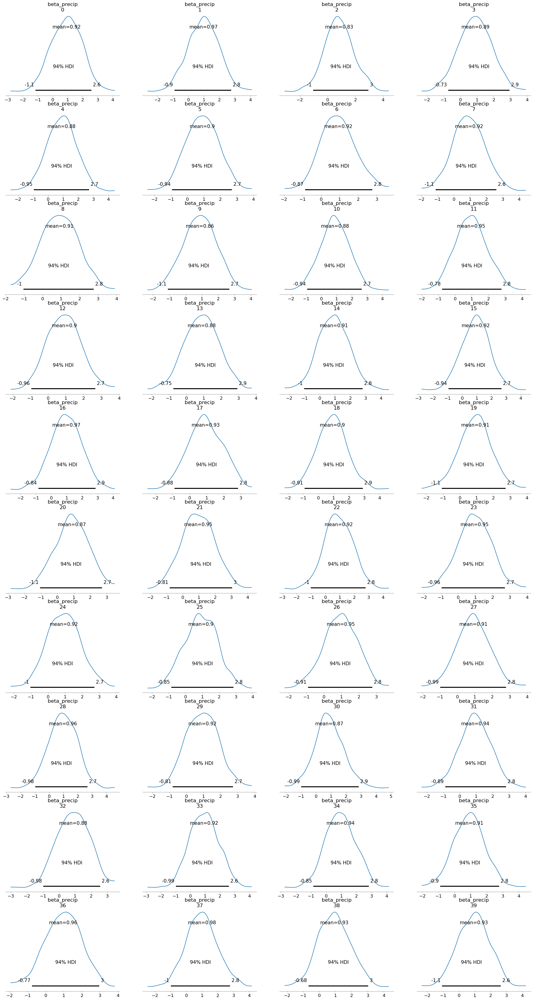

In [ ]:
az.plot_posterior(prior, var_names=['beta_precip'], group='prior')

# trying different models

### MODEL 1A: original

code status: done

In [315]:
with pm.Model() as outbreak_model:

    # outbreak probability (alpha) intercept
    # mu is overall mean outbreak prob, sigma is var of outbreak prob between states
    mu_alpha = pm.Normal("mu_alpha", mu=pm.math.logit(0.05), sigma=2)
    sigma_alpha = pm.HalfNormal("sigma_alpha", sigma=1)

    # outbreak prob per state
    alpha = pm.Normal("alpha", mu=mu_alpha, sigma=sigma_alpha, shape=num_states)

    # temperature effect for all states
    beta_temp = pm.Normal("beta_temp", mu=0, sigma=1)

    # precipitation effect for all states
    beta_precip = pm.Normal("beta_precip", mu=0, sigma=1)

    # linear predictor (intercept + covariate*data + covariate*data)
    eta = alpha[state_idx] + beta_temp * temp + beta_precip * precip

    # prob of outbreak
    # taking the sigmoid of the linear predictor compresses it into value in [0,1]
    p = pm.Deterministic("p", pm.math.sigmoid(eta))

    # likelihood
    y_obs = pm.Bernoulli("y_obs", p=p, observed=y)

    param_names = ["mu_alpha", "sigma_alpha", "alpha", "beta_temp", "beta_precip"]

### MODEL 1C: make beta temp covariate hierarchical

code status: done

In [ ]:
with pm.Model() as outbreak_model:

    # outbreak probability (alpha) intercept
    # mu is overall mean outbreak prob, sigma is var of outbreak prob between states
    mu_alpha = pm.Normal("mu_alpha", mu=pm.math.logit(0.05), sigma=2)
    sigma_alpha = pm.HalfNormal("sigma_alpha", sigma=1)

    # outbreak prob per state
    alpha = pm.Normal("alpha", mu=mu_alpha, sigma=sigma_alpha, shape=num_states)

    # temperature effect for each state
    sigma_temp = pm.HalfNormal('sigma_temp', sigma=4)
    beta_temp = pm.Normal("beta_temp", mu=0, sigma=sigma_temp, shape=num_states)

    # precipitation effect for all states
    beta_precip = pm.Normal("beta_precip", mu=0, sigma=1)


    # linear predictor
    eta = alpha[state_idx] + beta_temp[state_idx] * temp + beta_precip * precip

    # prob of outbreak
    # taking the sigmoid of the linear predictor compresses it into value in [0,1]
    p = pm.Deterministic("p", pm.math.sigmoid(eta))

    # likelihood
    y_obs = pm.Bernoulli("y_obs", p=p, observed=y)

    param_names = ["mu_alpha", "sigma_alpha", "sigma_temp", "alpha", "beta_temp", "beta_precip"]

### MODEL 1D: make precip covariate hierarchical

code status: done

In [ ]:
with pm.Model() as outbreak_model:

    # outbreak probability (alpha) intercept
    # mu is overall mean outbreak prob, sigma is var of outbreak prob between states
    mu_alpha = pm.Normal("mu_alpha", mu=pm.math.logit(0.05), sigma=2)
    sigma_alpha = pm.HalfNormal("sigma_alpha", sigma=1)

    # outbreak prob per state
    alpha = pm.Normal("alpha", mu=mu_alpha, sigma=sigma_alpha, shape=num_states)

    # temperature effect (beta_temp) covariate
    # temp effect for all states
    beta_temp = pm.Normal("beta_temp", mu=0, sigma=1)

    # precipitaion effect (beta_precip) covariate
    # precip effect for each state
    sigma_precip = pm.HalfNormal('sigma_precip', sigma=1)
    beta_precip = pm.Normal("beta_precip", mu=0, sigma=sigma_precip, shape=num_states)


    # linear predictor
    eta = alpha[state_idx] + beta_temp * temp + beta_precip[state_idx] * precip

    # prob of outbreak
    # taking the sigmoid of the linear predictor compresses it into value in [0,1]
    p = pm.Deterministic("p", pm.math.sigmoid(eta))

    # likelihood
    y_obs = pm.Bernoulli("y_obs", p=p, observed=y)

    param_names = ["mu_alpha", "sigma_alpha", "sigma_precip", "alpha", "beta_temp", "beta_precip"]

### MODEL 1E: make temp and precip covariates hierarchical

code status: done

In [289]:
with pm.Model() as outbreak_model:

    # outbreak probability (alpha) intercept
    # mu is overall mean outbreak prob, sigma is var of outbreak prob between states
    mu_alpha = pm.Normal("mu_alpha", mu=pm.math.logit(0.05), sigma=2)
    sigma_alpha = pm.HalfNormal("sigma_alpha", sigma=1)

    # outbreak prob per state
    alpha = pm.Normal("alpha", mu=mu_alpha, sigma=sigma_alpha, shape=num_states)

    # temperature effect for each state
    sigma_temp = pm.HalfNormal('sigma_temp', sigma=4)
    beta_temp = pm.Normal("beta_temp", mu=0, sigma=sigma_temp, shape=num_states)

    # precipitation effect for each state
    sigma_precip = pm.HalfNormal('sigma_precip', sigma=1)
    beta_precip = pm.Normal("beta_precip", mu=0, sigma=sigma_precip, shape=num_states)


    # linear predictor (intercept + covariate*data + covariate*data)    # eta with state diff in temp and precip and outbreak prob
    eta = alpha[state_idx] + beta_temp[state_idx] * temp + beta_precip[state_idx] * precip

    # prob of outbreak
    # taking the sigmoid of the linear predictor compresses it into value in [0,1]
    p = pm.Deterministic("p", pm.math.sigmoid(eta))

    # likelihood
    y_obs = pm.Bernoulli("y_obs", p=p, observed=y)

    param_names = ["mu_alpha", "sigma_alpha", "sigma_temp", "sigma_precip", "alpha", "beta_temp", "beta_precip"]

# sample from posterior

In [316]:
with outbreak_model:
    trace = pm.sample(2000, tune=1000, target_accept=0.9)

Output()

## autocorrelation plots
checks MCMC efficiency: high autocorrelation = samples are not independent = sampler mixing poorly (could be too-heavy priors)

### model notes
1. model 1a: GOOD

/usr/local/lib/python3.12/dist-packages/arviz/plots/plot_utils.py:270: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (308) in plot_autocorr, generating only 40 plots
  warnings.warn(


array([[<Axes: title={'center': 'mu_alpha\n0'}>,
        <Axes: title={'center': 'mu_alpha\n1'}>,
        <Axes: title={'center': 'sigma_alpha\n0'}>,
        <Axes: title={'center': 'sigma_alpha\n1'}>],
       [<Axes: title={'center': 'sigma_temp\n0'}>,
        <Axes: title={'center': 'sigma_temp\n1'}>,
        <Axes: title={'center': 'sigma_precip\n0'}>,
        <Axes: title={'center': 'sigma_precip\n1'}>],
       [<Axes: title={'center': 'alpha\n0, 0'}>,
        <Axes: title={'center': 'alpha\n0, 1'}>,
        <Axes: title={'center': 'alpha\n0, 2'}>,
        <Axes: title={'center': 'alpha\n0, 3'}>],
       [<Axes: title={'center': 'alpha\n0, 4'}>,
        <Axes: title={'center': 'alpha\n0, 5'}>,
        <Axes: title={'center': 'alpha\n0, 6'}>,
        <Axes: title={'center': 'alpha\n0, 7'}>],
       [<Axes: title={'center': 'alpha\n0, 8'}>,
        <Axes: title={'center': 'alpha\n0, 9'}>,
        <Axes: title={'center': 'alpha\n0, 10'}>,
        <Axes: title={'center': 'alpha\n0, 11'

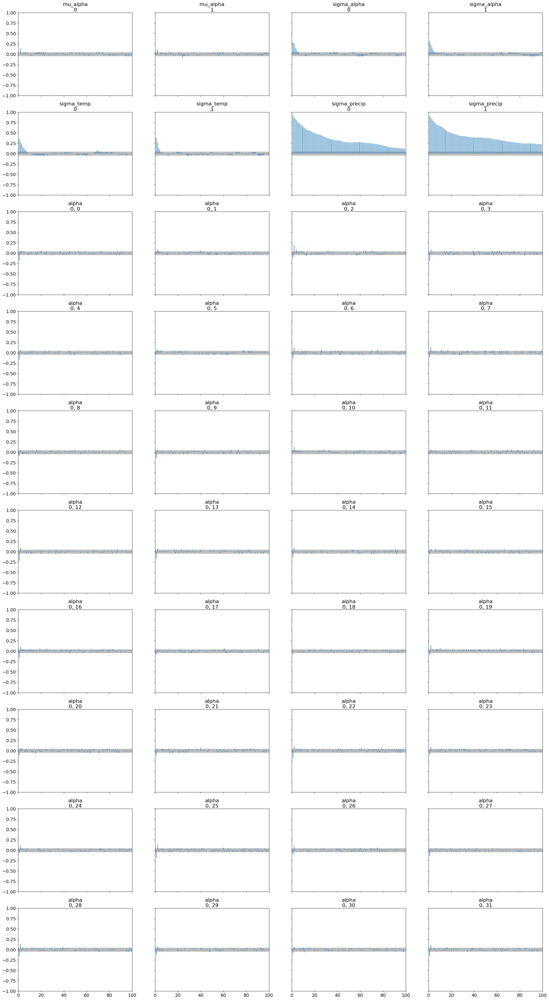

In [292]:
az.plot_autocorr(trace, var_names=param_names)

# prior sensitivity analysis
look at the plot below, it is a summary of the most important part of each parameter's posterior distribution

test with weak vs more informative prior -> does it change the plot much?

array([<Axes: title={'center': '95.0% HDI'}>], dtype=object)

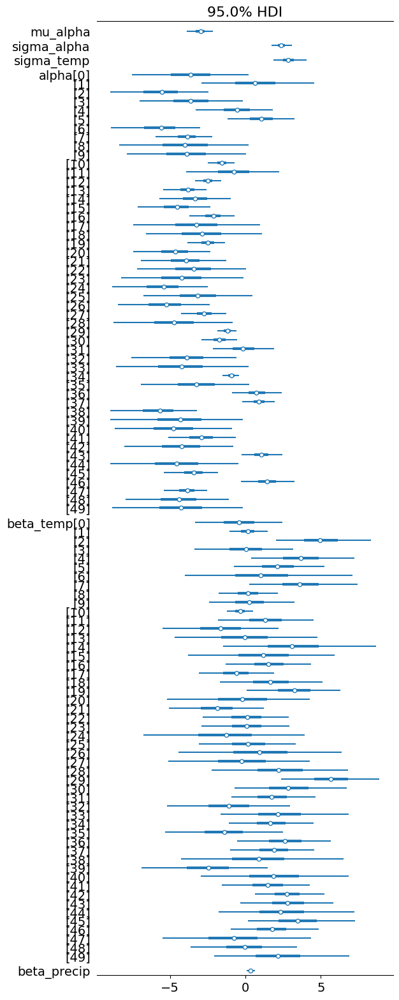

In [ ]:
az.plot_forest(trace, combined=True, hdi_prob=0.95, var_names=param_names)

# posterior summaries

In [310]:
summary = az.summary(trace, var_names=param_names)
summary

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
mu_alpha,-2.995,0.437,-3.834,-2.212,0.008,0.006,2931.0,2826.0,1.00
sigma_alpha,2.311,0.355,1.644,2.956,0.009,0.006,1421.0,2244.0,1.00
sigma_temp,2.798,0.548,1.710,3.748,0.016,0.009,1197.0,2082.0,1.00
sigma_precip,0.343,0.211,0.014,0.696,0.038,0.008,25.0,98.0,1.07
alpha[0],-3.401,1.951,-7.030,0.407,0.029,0.031,4461.0,2865.0,1.00
...,...,...,...,...,...,...,...,...,...
beta_precip[45],0.135,0.365,-0.473,0.938,0.014,0.022,930.0,1029.0,1.02
beta_precip[46],0.104,0.317,-0.458,0.785,0.009,0.014,2065.0,1664.0,1.02
beta_precip[47],0.084,0.393,-0.605,0.955,0.008,0.021,2909.0,1155.0,1.03
beta_precip[48],0.018,0.380,-0.750,0.748,0.006,0.021,4791.0,1024.0,1.03


In [312]:
hier_params = ["alpha", "beta_temp", "beta_precip"]
avg_rows = []

for param in hier_params:
    param_rows = summary[summary.index.str.startswith(f"{param}[")]

    if not param_rows.empty:
        # average across states
        param_avg = param_rows.mean(axis=0)
        param_avg.name = f"{param}_mean_states"

        # transform for interpretability
        if param == "alpha":
            for col in ["mean", "hdi_3%", "hdi_97%"]:
                param_avg[col] = sigmoid(param_avg[col])
        else:
            for col in ["mean", "hdi_3%", "hdi_97%"]:
                param_avg[col] = np.exp(param_avg[col])

        avg_rows.append(param_avg)
        summary = summary.drop(param_rows.index)


summary_final = pd.concat([summary] + [r.to_frame().T for r in avg_rows])

summary_final = summary_final.reset_index().rename(columns={"index": "parameter"})

num_cols = summary_final.select_dtypes(include=np.number).columns
summary_final[num_cols] = summary_final[num_cols].round(3)

print(summary_final)

                 parameter   mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  \
0                 mu_alpha -2.995  0.437  -3.834   -2.212      0.008    0.006   
1              sigma_alpha  2.311  0.355   1.644    2.956      0.009    0.006   
2               sigma_temp  2.798  0.548   1.710    3.748      0.016    0.009   
3             sigma_precip  0.343  0.211   0.014    0.696      0.038    0.008   
4        alpha_mean_states  0.048  1.387   0.004    0.393      0.022    0.024   
5    beta_temp_mean_states  3.275  1.793   0.119   98.988      0.027    0.031   
6  beta_precip_mean_states  1.033  0.375   0.502    2.198      0.010    0.021   

   ess_bulk  ess_tail  r_hat  
0   2931.00   2826.00  1.000  
1   1421.00   2244.00  1.000  
2   1197.00   2082.00  1.000  
3     25.00     98.00  1.070  
4   4090.76   2758.38  1.000  
5   4482.18   2804.36  1.000  
6   3580.78   1245.04  1.024  


## probability density and trace plots

array([[<Axes: title={'center': 'mu_alpha'}>,
        <Axes: title={'center': 'mu_alpha'}>],
       [<Axes: title={'center': 'sigma_alpha'}>,
        <Axes: title={'center': 'sigma_alpha'}>],
       [<Axes: title={'center': 'sigma_temp'}>,
        <Axes: title={'center': 'sigma_temp'}>],
       [<Axes: title={'center': 'sigma_precip'}>,
        <Axes: title={'center': 'sigma_precip'}>],
       [<Axes: title={'center': 'alpha'}>,
        <Axes: title={'center': 'alpha'}>],
       [<Axes: title={'center': 'beta_temp'}>,
        <Axes: title={'center': 'beta_temp'}>],
       [<Axes: title={'center': 'beta_precip'}>,
        <Axes: title={'center': 'beta_precip'}>]], dtype=object)

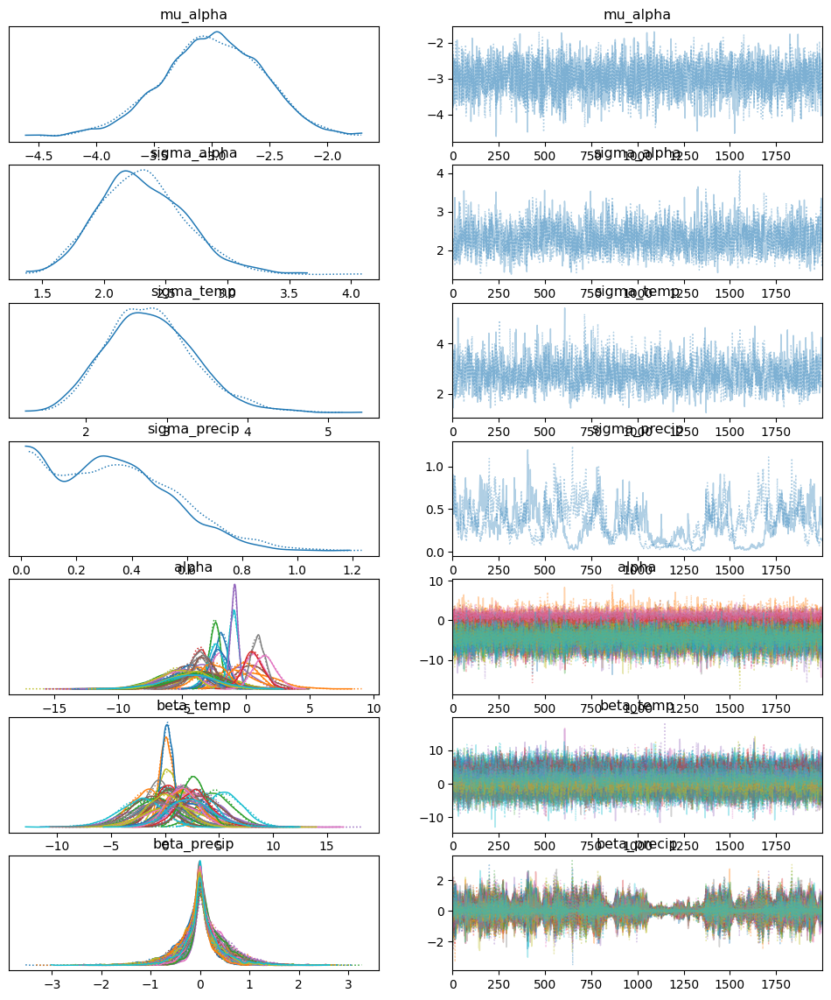

In [291]:
az.plot_trace(trace, var_names=param_names)

## posterior predictive check
asks if the model were true, what data would it generate? compares simulated data vs observed data and detects
underdispersion/overdispersion, bad link functions, missing predictors, bad likelihood (wrong distribution)

you should also check if the model cpatured any overdispersion

In [317]:
with outbreak_model:
    ppc = pm.sample_posterior_predictive(trace, var_names=['y_obs'], random_seed=29)

# simulated outbreaks with shape (num samples, num obs)
y_ppc = ppc.posterior_predictive["y_obs"].values

# combine chains and draws (samples, observations)
y_ppc = y_ppc.reshape(-1, y_ppc.shape[-1])

y_sim_mean = y_ppc.mean(axis=0)

Output()

In [ ]:
# get proportion of outbreaks for each state
observed_prop = np.zeros(num_states)
for s in range(num_states):
    mask = (state_idx == s)
    observed_prop[s] = y[mask].mean()

In [ ]:
predicted_prop = np.zeros((y_ppc.shape[0], num_states))

for s in range(num_states):
    mask = (state_idx == s)
    predicted_prop[:, s] = y_ppc[:, mask].mean(axis=1)

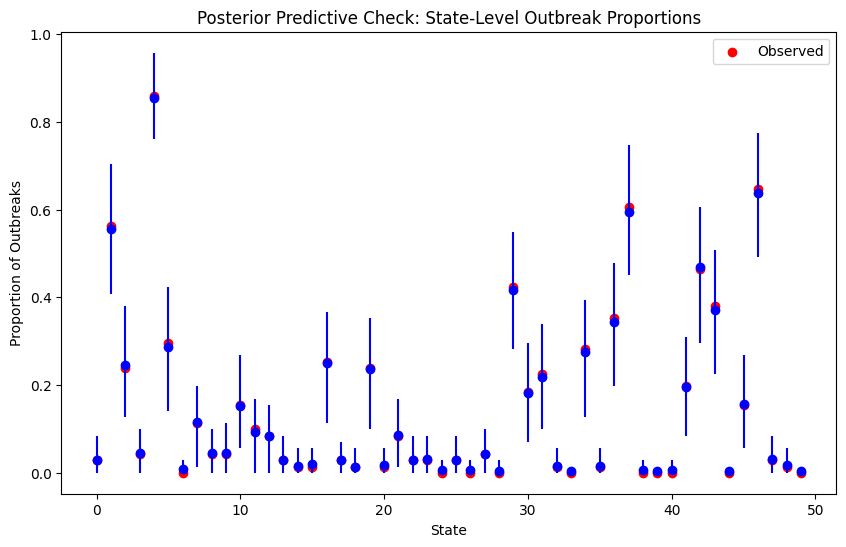

In [ ]:
plt.figure(figsize=(10, 6))

for s in range(num_states):
    # distribution of predicted proportions for state s
    pred_mean = predicted_prop[:, s].mean()
    pred_hdi = az.hdi(predicted_prop[:, s], hdi_prob=0.94)

    plt.errorbar(
        s, pred_mean,
        yerr=[[pred_mean - pred_hdi[0]], [pred_hdi[1] - pred_mean]],
        fmt='o', color='blue'
    )

# plot observed proportions
plt.scatter(range(num_states), observed_prop, color='red', label='Observed')

plt.xlabel("State")
plt.ylabel("Proportion of Outbreaks")
plt.title("Posterior Predictive Check: State-Level Outbreak Proportions")
plt.legend()
plt.show()

## plot posterior distributions
visualizes the posterior distribution of each parameter to understand what the model believes about each parameter after seeing the data

/usr/local/lib/python3.12/dist-packages/arviz/plots/plot_utils.py:270: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (104) in plot_posterior, generating only 40 plots
  warnings.warn(


array([[<Axes: title={'center': 'mu_alpha'}>,
        <Axes: title={'center': 'sigma_alpha'}>,
        <Axes: title={'center': 'sigma_temp'}>,
        <Axes: title={'center': 'alpha\n0'}>],
       [<Axes: title={'center': 'alpha\n1'}>,
        <Axes: title={'center': 'alpha\n2'}>,
        <Axes: title={'center': 'alpha\n3'}>,
        <Axes: title={'center': 'alpha\n4'}>],
       [<Axes: title={'center': 'alpha\n5'}>,
        <Axes: title={'center': 'alpha\n6'}>,
        <Axes: title={'center': 'alpha\n7'}>,
        <Axes: title={'center': 'alpha\n8'}>],
       [<Axes: title={'center': 'alpha\n9'}>,
        <Axes: title={'center': 'alpha\n10'}>,
        <Axes: title={'center': 'alpha\n11'}>,
        <Axes: title={'center': 'alpha\n12'}>],
       [<Axes: title={'center': 'alpha\n13'}>,
        <Axes: title={'center': 'alpha\n14'}>,
        <Axes: title={'center': 'alpha\n15'}>,
        <Axes: title={'center': 'alpha\n16'}>],
       [<Axes: title={'center': 'alpha\n17'}>,
        <Axes: t

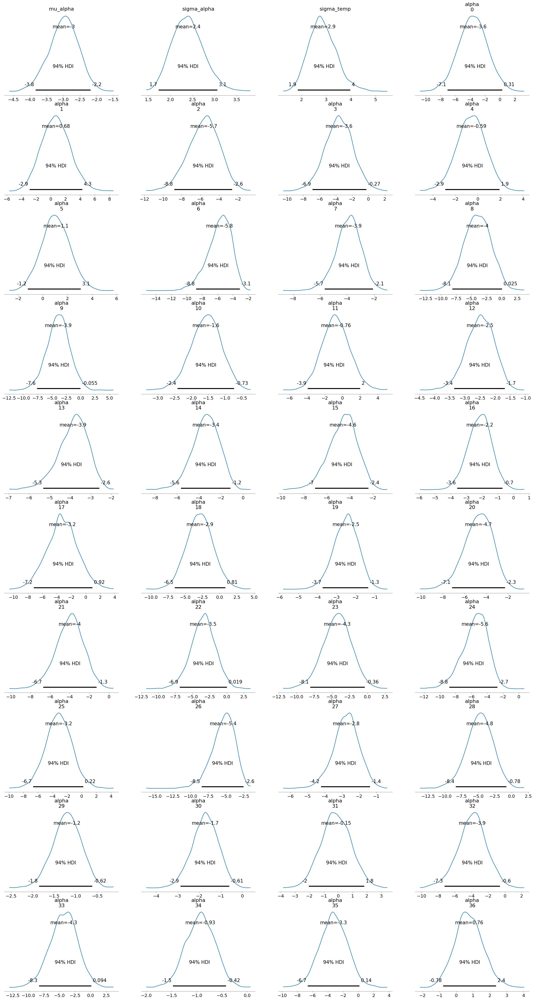

In [ ]:
az.plot_posterior(trace, var_names=param_names)

### ROC AUC score

In [ ]:
roc_auc_score(y, y_sim_mean)

np.float64(0.9013619300104034)

### odds ratio
outbreak odds increase by (odds ratio - 1)%

temp mean OR: <xarray.DataArray 'beta_temp' ()> Size: 8B
array(225.9971713)
temp 95% CI: <xarray.Dataset> Size: 1kB
Dimensions:          (beta_temp_dim_0: 50, hdi: 2)
Coordinates:
  * beta_temp_dim_0  (beta_temp_dim_0) int64 400B 0 1 2 3 4 5 ... 45 46 47 48 49
  * hdi              (hdi) <U6 48B 'lower' 'higher'
Data variables:
    beta_temp        (beta_temp_dim_0, hdi) float64 800B 0.002989 ... 573.4
precip mean OR: 1.4125561709718095
precip 95% CI: [1.05490801 1.83670555]


/usr/local/lib/python3.12/dist-packages/arviz/plots/plot_utils.py:270: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (50) in plot_posterior, generating only 40 plots
  warnings.warn(


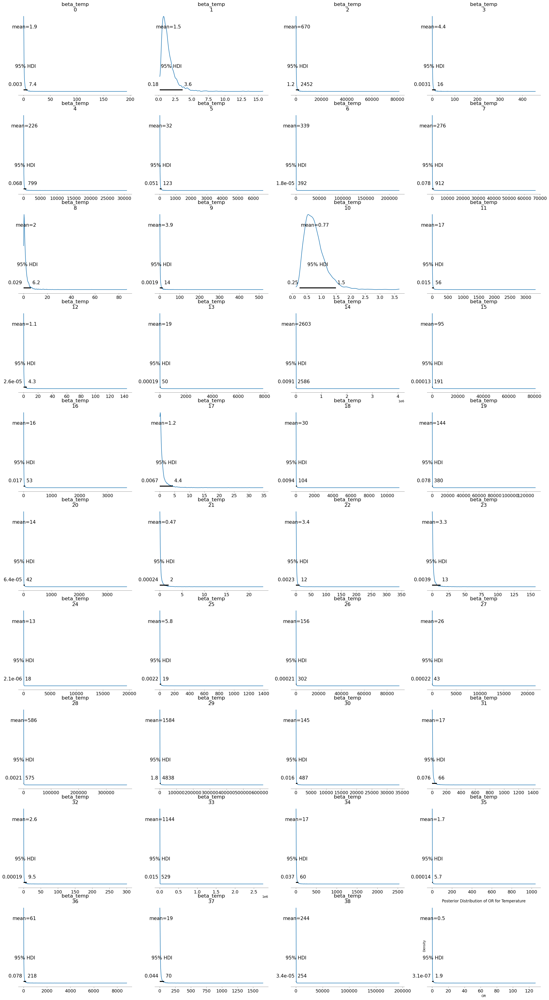

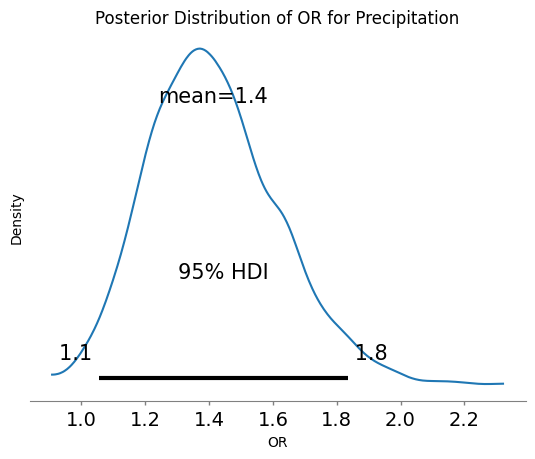

In [ ]:
# nonhierarchical
# beta_temp = trace.posterior["beta_temp"].values.flatten()
# OR_temp = np.exp(beta_temp)
# hierarchical
OR_temp = np.exp(trace.posterior["beta_temp"])

temp_mean_OR = OR_temp.mean()
temp_hdi_OR = az.hdi(OR_temp, hdi_prob=0.95)

print("temp mean OR:", temp_mean_OR)
print("temp 95% CI:", temp_hdi_OR)

# nonhierarchical
beta_precip = trace.posterior["beta_precip"].values.flatten()
OR_precip = np.exp(beta_precip)
# hierarchical
# OR_precip = np.exp(trace.posterior["beta_precip"])

precip_mean_OR = OR_precip.mean()
precip_hdi_OR = az.hdi(OR_precip, hdi_prob=0.95)

print("precip mean OR:", precip_mean_OR)
print("precip 95% CI:", precip_hdi_OR)

az.plot_posterior(OR_temp, hdi_prob=0.95)
plt.title("Posterior Distribution of OR for Temperature")
plt.xlabel("OR")
plt.ylabel("Density")
plt.show()

az.plot_posterior(OR_precip, hdi_prob=0.95)
plt.title("Posterior Distribution of OR for Precipitation")
plt.xlabel("OR")
plt.ylabel("Density")
plt.show()

### inverse logit for probabilities
generate probability curves across a range of predictor values

what is the probability of an outbreak at each possible temperature value?

* x axis: temp
* y axis: predicted probability of outbreak
* line: mean predicted probability
* ribbon: credible interval across posterior draws

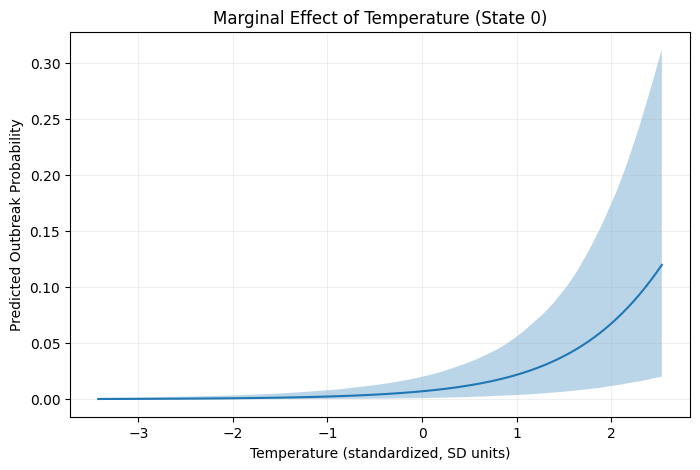

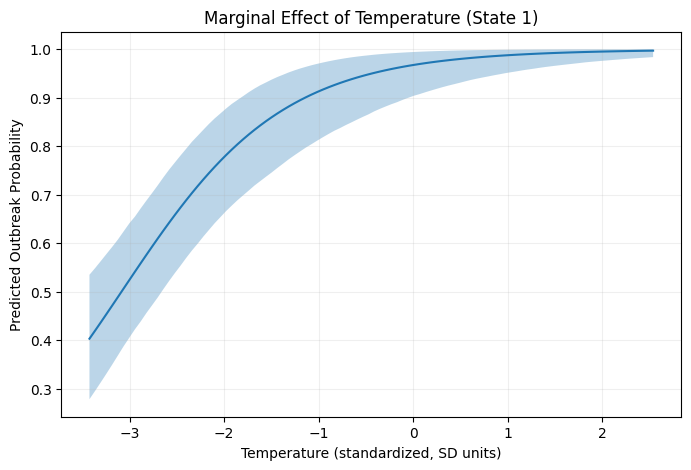

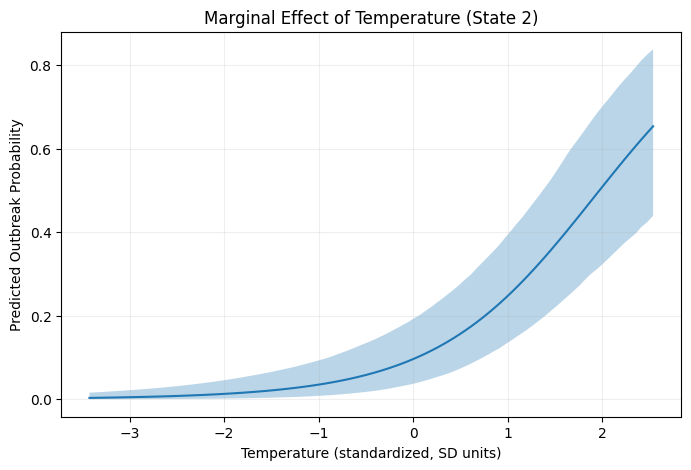

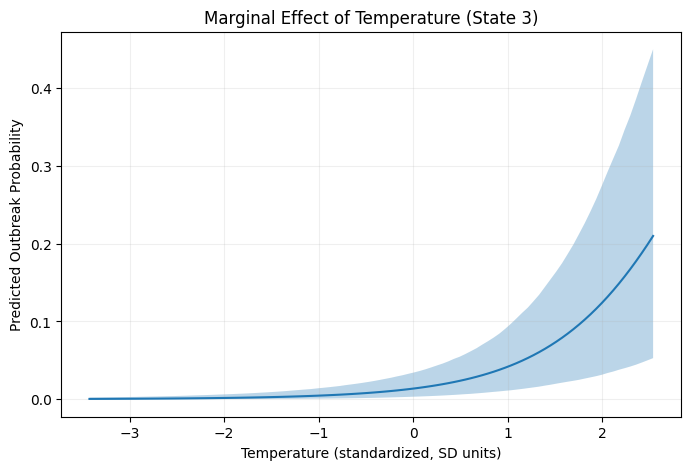

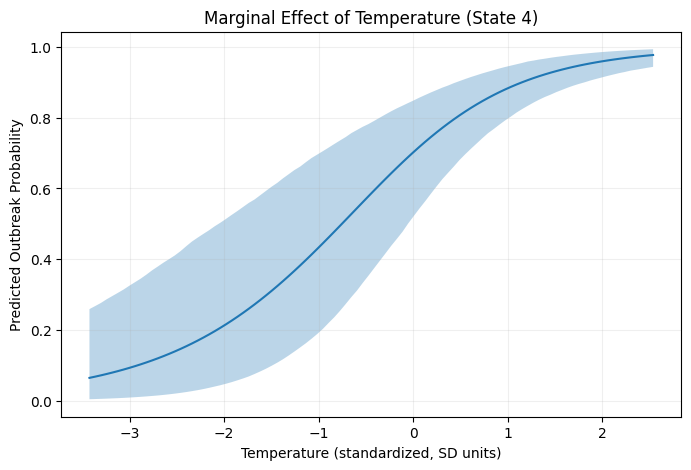

...

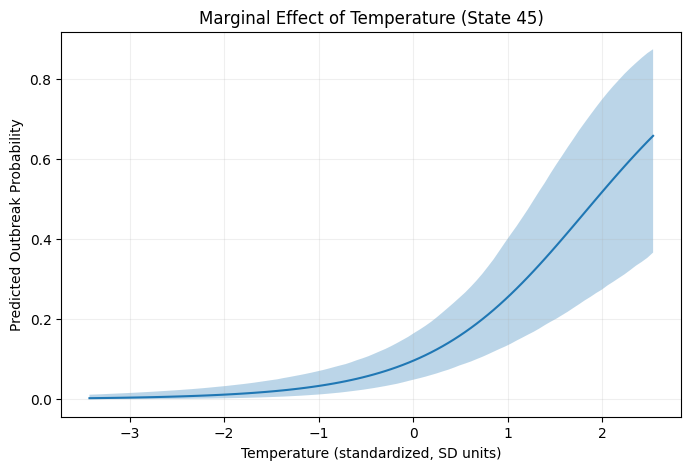

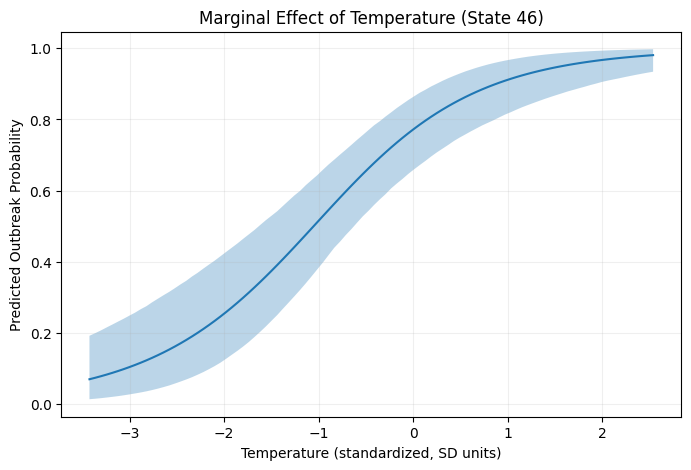

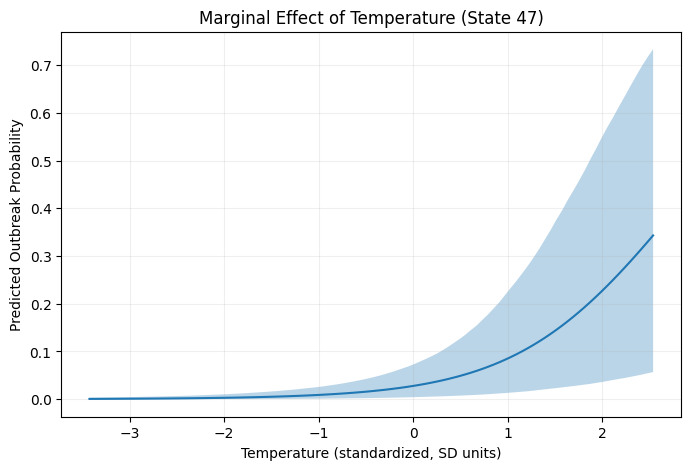

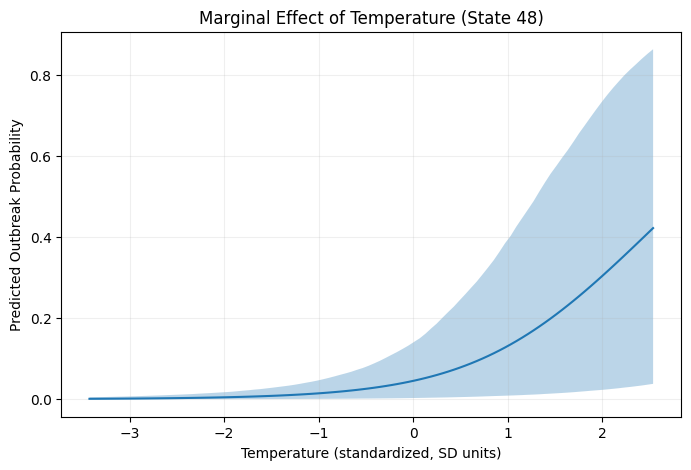

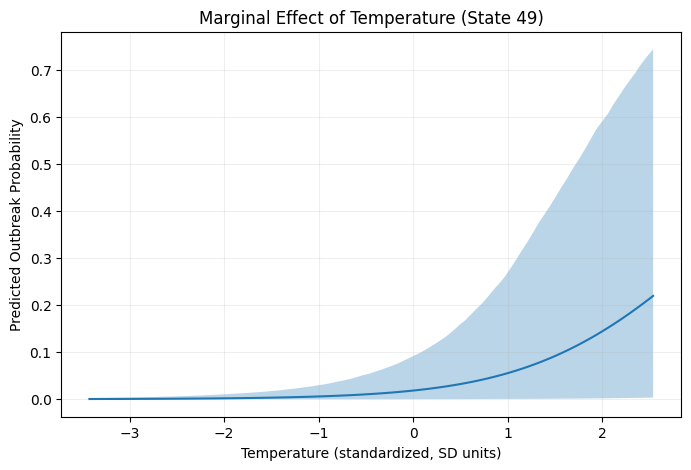

In [318]:
alpha_post = trace.posterior["alpha"].stack(draws=("chain", "draw")).values.T   # (4000, 50)
beta_temp_post = trace.posterior["beta_temp"].stack(draws=("chain", "draw")).values  # (4000,) # if hierarchical add .T
beta_precip_post = trace.posterior["beta_precip"].stack(draws=("chain", "draw")).values # (4000,) # if hierarchical add .T

# choose a state
states_to_plot = [i for i in range(50)]

# hold precip constant at its mean (can choose median, or any value)
precip_ref = np.mean(precip)

# predictor grid for temperature
temp_grid = np.linspace(temp.min(), temp.max(), 100)

for state in states_to_plot:
    # linear predictor — shape (4000, 100)
    eta = (
        alpha_post[:, state][:, None] +
        beta_temp_post[:, None] * temp_grid[None, :] +
        beta_precip_post[:, None] * precip_ref
    )

    # # hierarchical ver
    # eta = (
    #     alpha_post[:, state][:, None] +            # (4000, 1)
    #     beta_temp_post[:, state][:, None] * temp_grid[None, :] +  # (4000, 100)
    #     beta_precip_post[:, state][:, None] * precip_ref         # (4000, 1)
    # )

    # # semi hierarchical ver (add [:, state] if hierarchical)
    # eta = (
    #     alpha_post[:, state][:, None] +
    #     beta_temp_post[:, state][:, None] * temp_grid[None, :] +
    #     beta_precip_post[:, None] * precip_ref
    # )

    # logistic transform
    probs = sigmoid(eta)

    # summarise
    mean_prob = probs.mean(axis=0)
    lower = np.percentile(probs, 2.5, axis=0)
    upper = np.percentile(probs, 97.5, axis=0)

    # plot
    plt.figure(figsize=(8,5))
    plt.plot(temp_grid, mean_prob)
    plt.fill_between(temp_grid, lower, upper, alpha=0.3)
    plt.xlabel("Temperature (standardized, SD units)")
    plt.ylabel("Predicted Outbreak Probability")
    plt.title(f"Marginal Effect of Temperature (State {state})")
    plt.grid(alpha=0.2)
    plt.show()

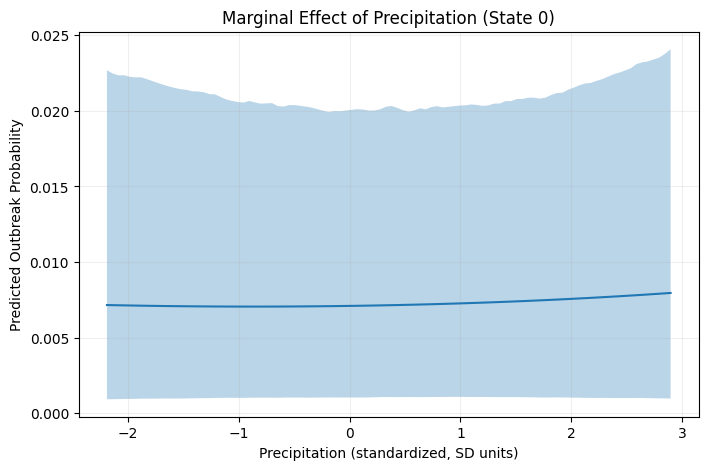

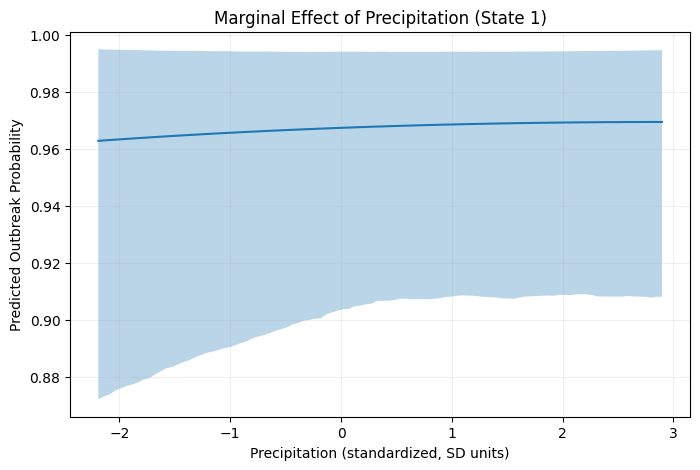

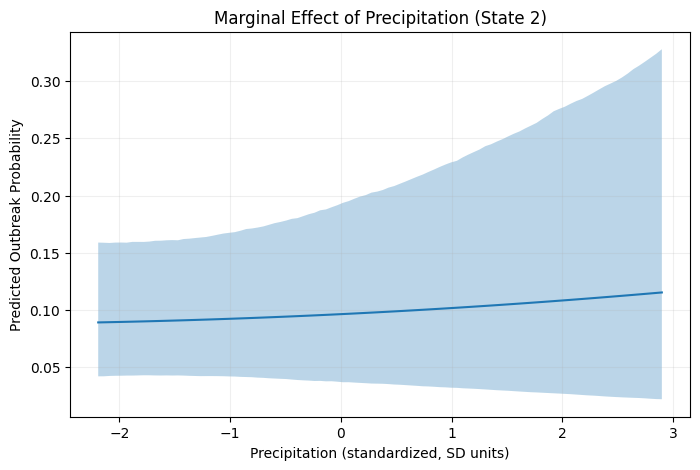

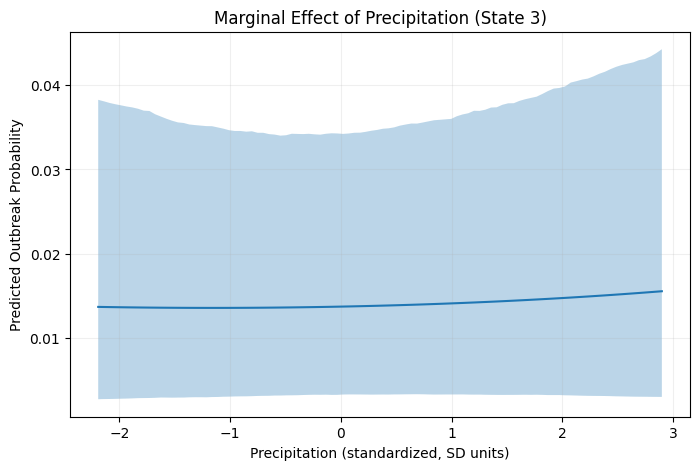

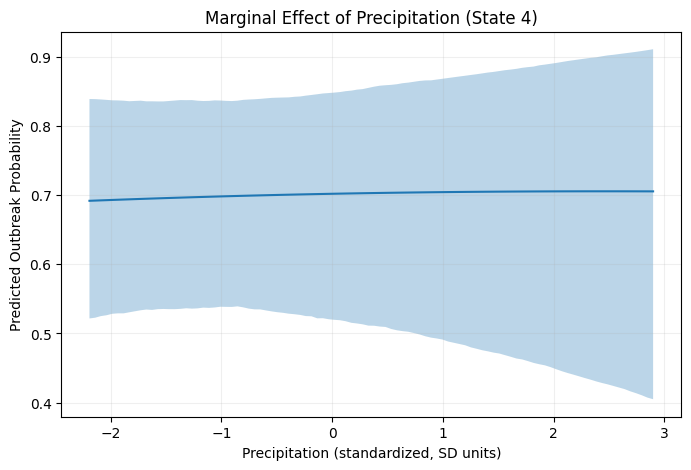

...

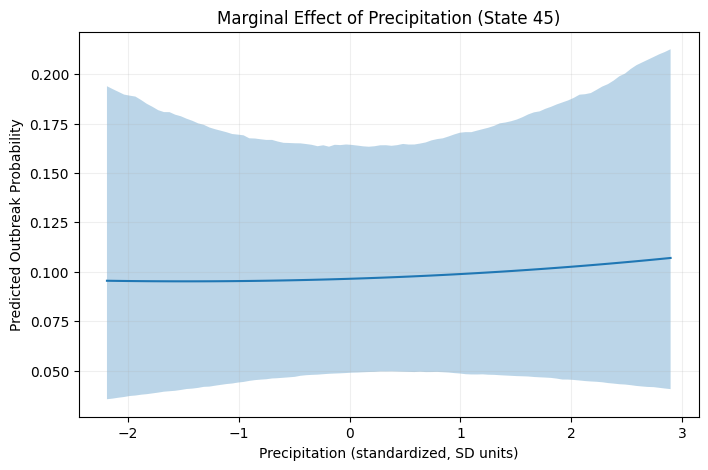

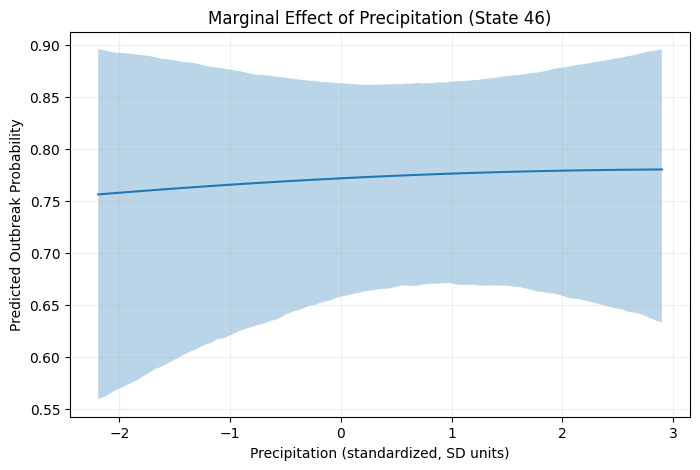

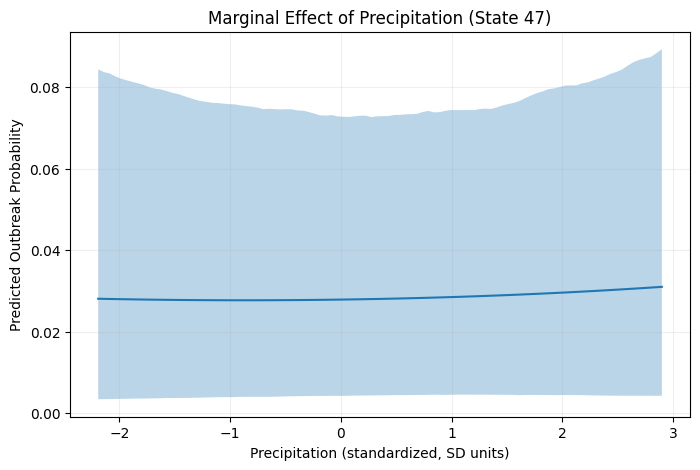

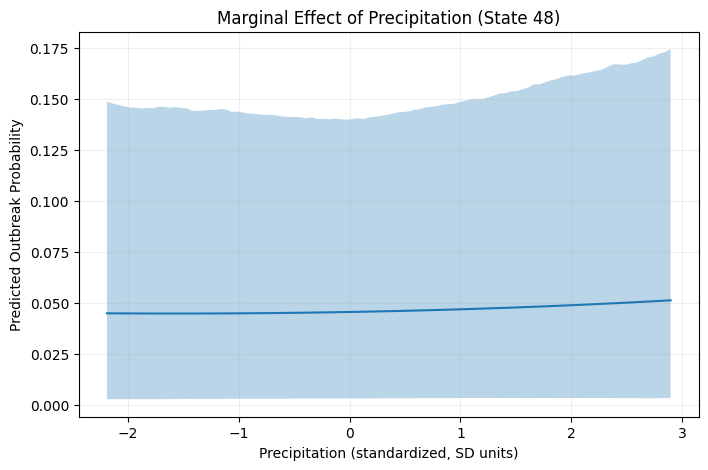

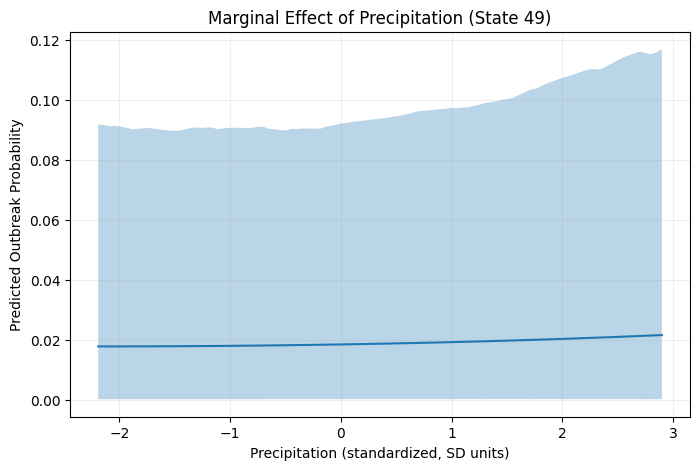

In [319]:
alpha_post = trace.posterior["alpha"].stack(draws=("chain", "draw")).values.T   # (4000, 50)
beta_temp_post = trace.posterior["beta_temp"].stack(draws=("chain", "draw")).values  # (4000,) # for hierarchical add .T
beta_precip_post = trace.posterior["beta_precip"].stack(draws=("chain", "draw")).values  # (4000,) # for hierarchical add .T

# choose a state
states_to_plot = [i for i in range(50)]

# hold precip constant at its mean (can choose median, or any value)
temp_ref = np.mean(temp)

# predictor grid for temperature
precip_grid = np.linspace(precip.min(), precip.max(), 100)

for state in states_to_plot:
    # linear predictor — shape (4000, 100)
    eta = (
        alpha_post[:, state][:, None] +
        beta_precip_post[:, None] * precip_grid[None, :] +
        beta_temp_post[:, None] * temp_ref
    )

    # # hierarchical
    # eta = (
    #     alpha_post[:, state][:, None] +            # (4000, 1)
    #     beta_temp_post[:, state][:, None] * temp_grid[None, :] +  # (4000, 100)
    #     beta_precip_post[:, state][:, None] * precip_ref         # (4000, 1)
    # )

    # # semi hierarchical ver (add [:, state] if hierarchical)
    # eta = (
    #     alpha_post[:, state][:, None] +
    #     beta_temp_post[:, state][:, None] * temp_grid[None, :] +
    #     beta_precip_post[:, None] * precip_ref
    # )

    # logistic transform
    probs = sigmoid(eta)

    # summarise
    mean_prob = probs.mean(axis=0)
    lower = np.percentile(probs, 2.5, axis=0)
    upper = np.percentile(probs, 97.5, axis=0)

    # plot
    plt.figure(figsize=(8,5))
    plt.plot(precip_grid, mean_prob)
    plt.fill_between(precip_grid, lower, upper, alpha=0.3)
    plt.xlabel("Precipitation (standardized, SD units)")
    plt.ylabel("Predicted Outbreak Probability")
    plt.title(f"Marginal Effect of Precipitation (State {state})")
    plt.grid(alpha=0.2)
    plt.show()

## posterior predictive density overlays
graphical comparisons in Bayesian statistics where you plot the distribution of simulated data (from the posterior predictive distribution) over the actual observed data's distribution (empirical distribution) to check how well your model fits reality

<Axes: ylabel='Density'>

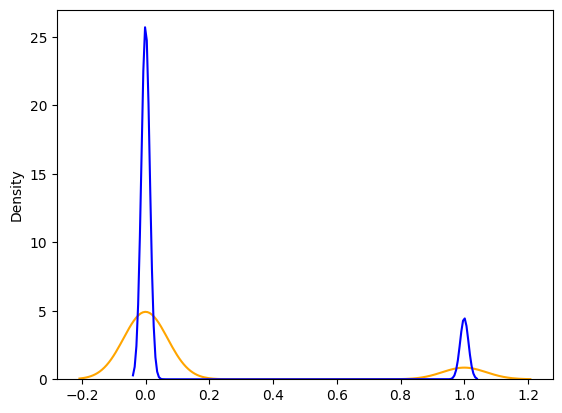

In [ ]:
sns.kdeplot(botulism['outbreak'].values, color="orange")
sns.kdeplot(y_ppc.flatten(), color='blue')